## First solution via OpenCV

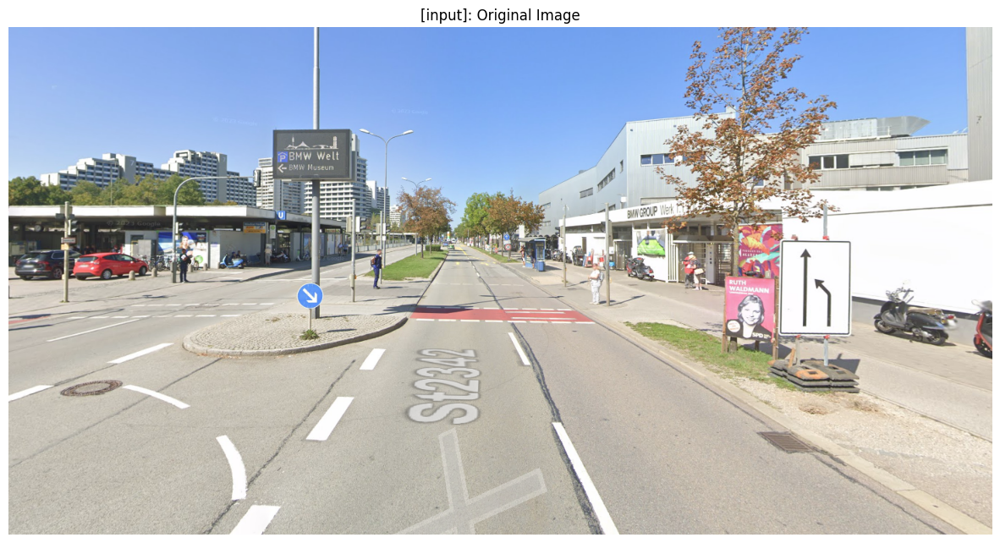

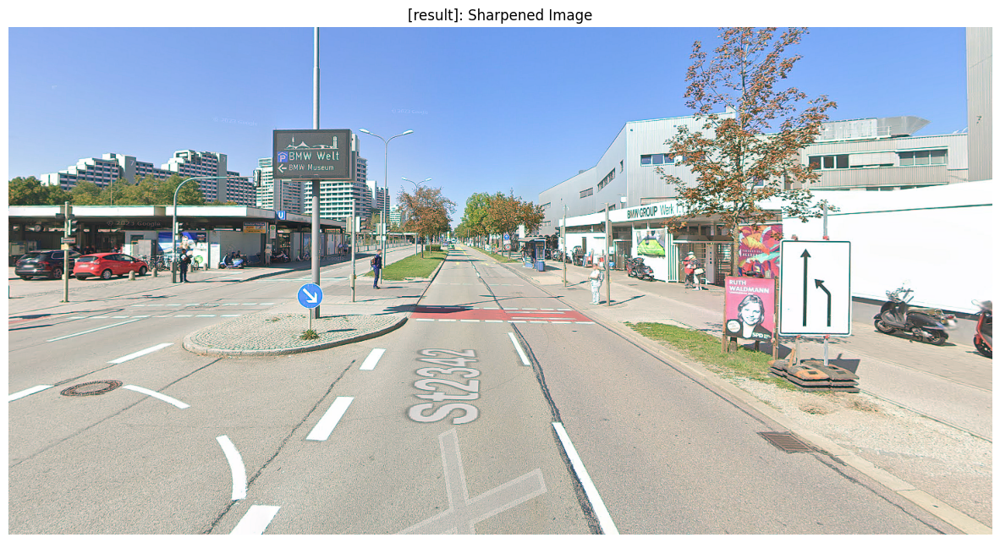

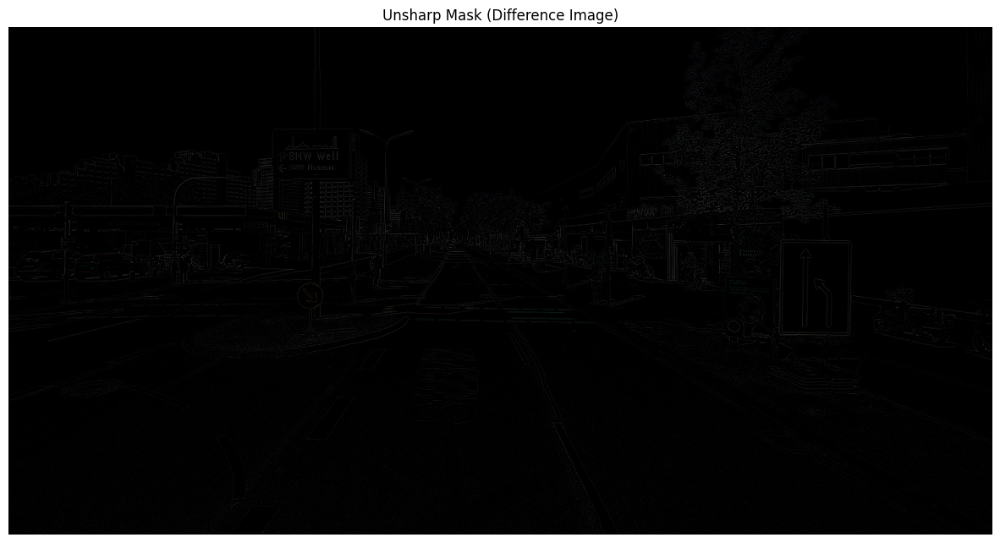

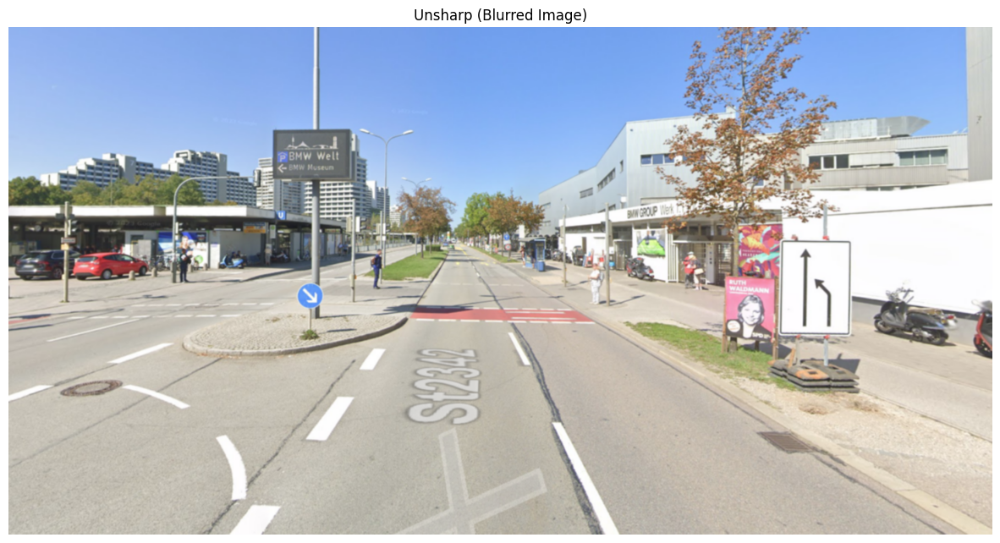

In [30]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]

sourceImagePath = '../../data/lesson_3/bmw-welt-street.png'
img = cv2.imread(sourceImagePath)

if img is None:
    raise FileNotFoundError(f"Image not found at {sourceImagePath}")

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_float = img.astype(np.float32)

amount = 5
unsharp_float = cv2.GaussianBlur(img_float, (3, 3), 0)

diff = cv2.subtract(img_float, unsharp_float)
scaled = cv2.multiply(diff, np.array([amount], dtype=np.float32))
sharpened = cv2.add(img_float, scaled)
sharpened = np.clip(sharpened, 0, 255).astype(np.uint8)

plt.title('[input]: Original Image')
plt.imshow(img)
plt.axis('off')
plt.show()

plt.title('[result]: Sharpened Image')
plt.imshow(sharpened)
plt.axis('off')
plt.show()

plt.title('Unsharp Mask (Difference Image)')
plt.imshow(np.clip(diff, 0, 255).astype(np.uint8), cmap='gray')
plt.axis('off')
plt.show()

plt.title('Unsharp (Blurred Image)')
plt.imshow(np.clip(unsharp_float, 0, 255).astype(np.uint8), cmap='gray')
plt.axis('off')
plt.show()




## Second solution via manual convolution via NumPy

100%|██████████| 745/745 [00:02<00:00, 296.32it/s]


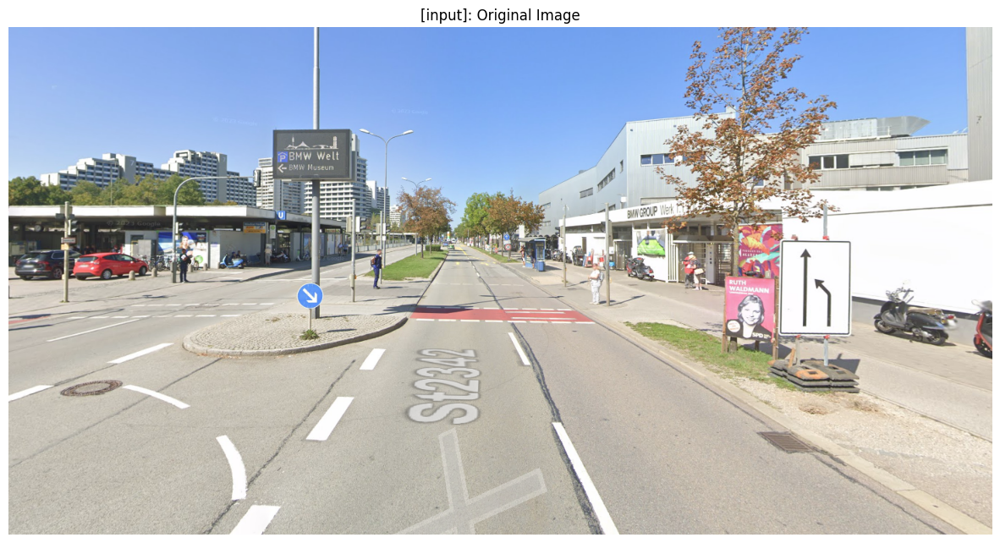

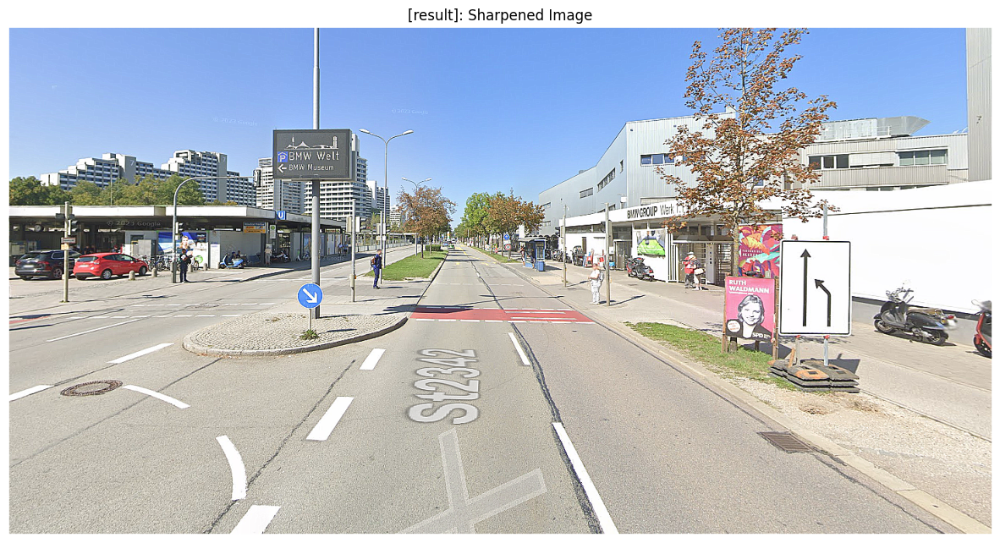

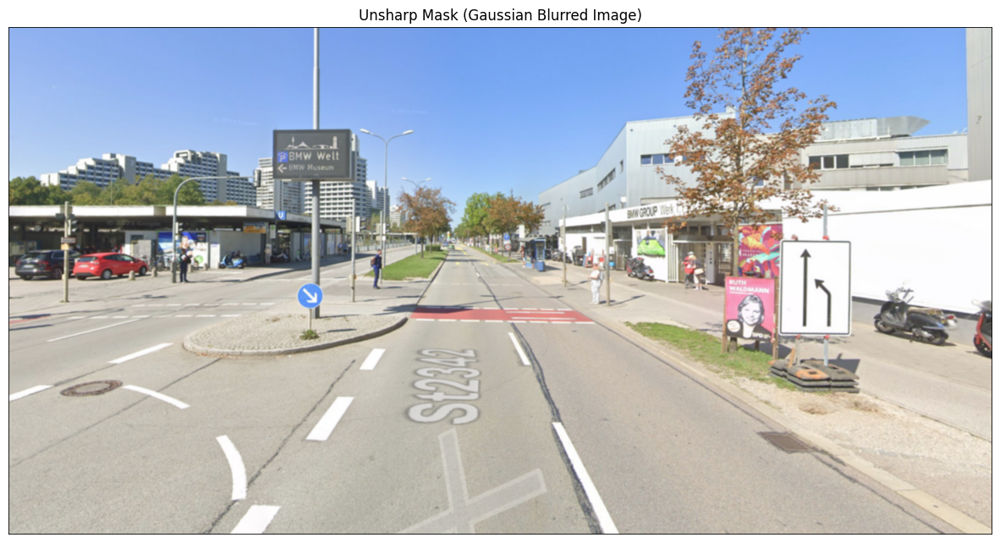

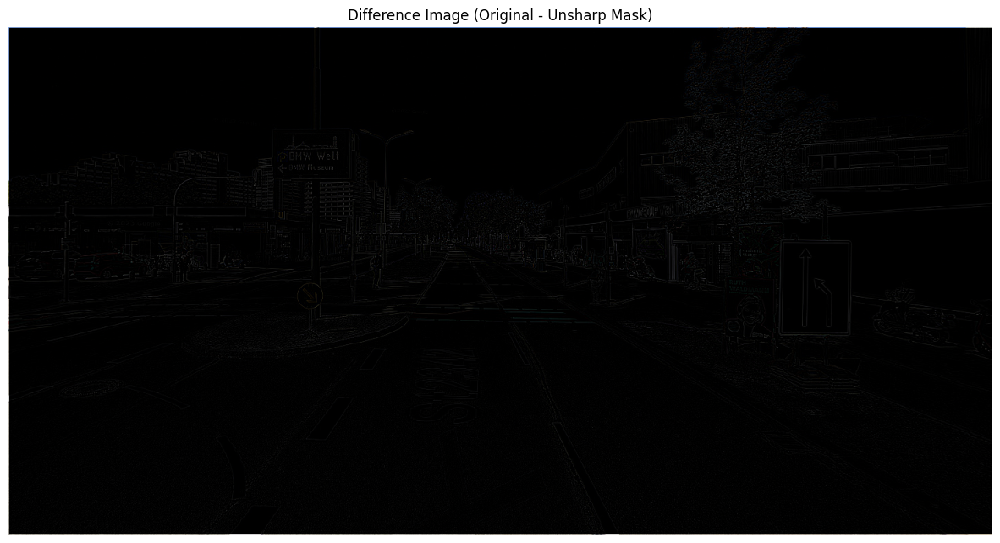

In [31]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from tqdm import tqdm
plt.rcParams['figure.figsize'] = [15, 10]

sourceImagePath = '../../data/lesson_3/bmw-welt-street.png'
img = cv2.imread(sourceImagePath)

if img is None:
    raise FileNotFoundError(f"Image not found at {sourceImagePath}")

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gaussian_kernel = np.array([
    [1, 2, 1],
    [2, 4, 2],
    [1, 2, 1]
], dtype=np.float32) / 16.0

unsharp = np.zeros_like(img)

for i in tqdm(range(1, img.shape[0] - 1)):
    for j in range(1, img.shape[1] - 1):
        region = img[i-1:i+2, j-1:j+2]
        unsharp[i, j] = np.sum(region * gaussian_kernel[:, :, np.newaxis], axis=(0, 1))

amount = 3
diff = img.astype(np.float32) - unsharp.astype(np.float32)

sharpened = img.astype(np.float32) + diff * amount
sharpened = np.clip(sharpened, 0, 255).astype(np.uint8)

plt.title('[input]: Original Image')
plt.imshow(img)
plt.axis('off')
plt.show()

plt.title('[result]: Sharpened Image')
plt.imshow(sharpened)
plt.axis('off')
plt.show()

plt.title('Unsharp Mask (Gaussian Blurred Image)')
plt.imshow(np.clip(unsharp, 0, 255).astype(np.uint8))
plt.axis('off')
plt.show()

plt.title('Difference Image (Original - Unsharp Mask)')
plt.imshow(np.clip(diff, 0, 255).astype(np.uint8), cmap='gray')
plt.axis('off')
plt.show()



What is a good (reasonable) value for the amount parameter?
> Думаю 1-3 - разумный диапазон для параметра amount.

What happens if it is too small?
>Ефект малозаметен

What happens if it is too large?
> Появляется шум и артефакты, изображение становится неестественным